In [2]:
import os
import sys

os.chdir('../')
sys.path.append(os.getcwd())

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from utils.viz_utils import plot_usage_matrix_pca, plot_boxplots_for_usage_matrix, _plot_feature_importance, plot_v_usage_hist, \
                                plot_cluster_map, significant_clones_distribution, plot_results_for_hla_class, plot_cluster_map, \
                            plot_clustermap_axes_based
from sklearn.manifold import TSNE, MDS

import warnings
warnings.filterwarnings('ignore')


import importlib
imported_module = importlib.import_module("utils.viz_utils")
importlib.reload(imported_module)

<module 'utils.viz_utils' from '/home/evlasova/tcr-covid-classifier/utils/viz_utils.py'>

In [3]:
fmba_desc = pd.read_csv('data/desc_fmba_not_nan_hla.csv').drop(columns=['Unnamed: 0'])
fmba_desc['run'] = fmba_desc['run'].apply(lambda x: x.split('.')[0])
fmba_desc = fmba_desc[['run', 'folder', 'COVID_status']]
fmba_desc = fmba_desc[fmba_desc.COVID_status != 'unknown'].replace({'precovid': 'healthy'})
fmba_desc.folder = fmba_desc.folder.apply(lambda x: x.split('_')[2])
fmba_desc

,run,folder,COVID_status
0,020000010808_S3_L001,NovaSeq5,COVID
1,020000110808_S14_L001,NovaSeq,COVID
2,020000190808_S27_L001,NovaSeq5,COVID
3,020000200808_S181_L002,NovaSeq5,healthy
4,020000280808_S59_L001,NovaSeq5,COVID
...,...,...,...
951,780008510808_S152_L002,NovaSeq3,COVID
952,780008550808_S150_L002,NovaSeq3,COVID
953,910000140808_S123_L002,NovaSeq2,COVID
954,910000320808_S121_L002,NovaSeq2,COVID


In [4]:
um_norm_bv = pd.read_csv('data/normalized_usage_matrix_fmba_TRB_v.csv').drop(columns=['Unnamed: 0'])
um_stand_log_exp_bv = pd.read_csv('data/standardized_usage_matrix_fmba_TRB_v.csv').drop(columns=['Unnamed: 0']).fillna(0)

In [5]:
um_norm_bj = pd.read_csv('data/normalized_usage_matrix_fmba_TRB_j.csv').drop(columns=['Unnamed: 0'])
um_stand_log_exp_bj = pd.read_csv('data/standardized_usage_matrix_fmba_TRB_j.csv').drop(columns=['Unnamed: 0']).fillna(0)

In [6]:
um_norm_av = pd.read_csv('data/normalized_usage_matrix_fmba_TRA_v.csv').drop(columns=['Unnamed: 0'])
um_stand_log_exp_av = pd.read_csv('data/standardized_usage_matrix_fmba_TRA_v.csv').drop(columns=['Unnamed: 0']).fillna(0)

In [7]:
um_norm_aj = pd.read_csv('data/normalized_usage_matrix_fmba_TRA_j.csv').drop(columns=['Unnamed: 0'])
um_stand_log_exp_aj = pd.read_csv('data/standardized_usage_matrix_fmba_TRA_j.csv').drop(columns=['Unnamed: 0']).fillna(0)

In [8]:
for norm in [um_norm_bv, um_norm_bj, um_norm_av, um_norm_aj, um_stand_log_exp_bv, um_stand_log_exp_bj, um_stand_log_exp_av, um_stand_log_exp_aj]:
    norm.run = norm.run.apply(lambda x: x.split('.')[0])


In [9]:
um_stand_log_exp_bv

,run,project,covid,TRBV5-5,TRBV7-7,TRBV11-3,TRBV29-1,TRBV14,TRBV7-9,TRBV7-1,...,TRBV10-1,TRBV11-2,TRBV6-5,TRBV7-6,TRBV17,TRBV4-3,TRBV16,TRBV28,TRBV4-1,is_test_run
0,050002290808_S117_L002,2020/09_FMBA_NovaSeq2_DNA,covid,0.013570,0.004574,0.001664,0.026744,0.012842,0.042911,6.667261e-07,...,0.007806,0.034738,0.003904,0.001904,2.333791e-08,0.002254,0.000002,0.057108,0.029319,False
1,050002630808_S113_L002,2020/09_FMBA_NovaSeq2_DNA,covid,0.004185,0.006531,0.010925,0.026395,0.010938,0.026040,7.415595e-07,...,0.017017,0.025430,0.054281,0.020843,2.595735e-08,0.018961,0.000003,0.046559,0.013867,False
2,050003120808_S112_L002,2020/09_FMBA_NovaSeq2_DNA,covid,0.011644,0.001631,0.016689,0.014387,0.008160,0.037554,6.640726e-07,...,0.002861,0.033062,0.049380,0.015458,2.324502e-08,0.007928,0.000002,0.042240,0.025373,False
3,050003130808_S114_L002,2020/09_FMBA_NovaSeq2_DNA,covid,0.009106,0.006611,0.016853,0.025371,0.007986,0.023917,6.630143e-07,...,0.009244,0.016000,0.041813,0.016452,2.320798e-08,0.002241,0.000002,0.021973,0.024616,False
4,050003450808_S118_L002,2020/09_FMBA_NovaSeq2_DNA,covid,0.009122,0.002842,0.008086,0.023729,0.017198,0.025521,6.771423e-07,...,0.003100,0.024073,0.044193,0.004949,2.370251e-08,0.016174,0.000002,0.048258,0.028851,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1220,p18_72_DNA_S88_L002,2021/01_FMBA_NovaSeq9,covid,0.012441,0.003710,0.009320,0.019186,0.015128,0.025437,7.203934e-07,...,0.003037,0.012261,0.017904,0.016601,2.647665e-08,0.019824,0.000003,0.051665,0.005797,False
1221,p18_73_DNA_S89_L002,2021/01_FMBA_NovaSeq9,covid,0.009105,0.004912,0.008825,0.027944,0.012896,0.043247,6.606936e-07,...,0.001973,0.011860,0.053139,0.016903,2.428250e-08,0.017538,0.000005,0.046454,0.007956,False
1222,p18_74_DNA_S90_L002,2021/01_FMBA_NovaSeq9,covid,0.007265,0.004894,0.009809,0.020590,0.010253,0.061540,6.344383e-07,...,0.013595,0.022566,0.067143,0.016197,2.331754e-08,0.016386,0.000002,0.006871,0.021692,False
1223,p18_75_DNA_S91_L002,2021/01_FMBA_NovaSeq9,covid,0.010073,0.004411,0.006432,0.022482,0.008310,0.043713,6.565571e-07,...,0.015572,0.028944,0.072927,0.017486,2.413047e-08,0.004559,0.000002,0.052571,0.028674,False


In [10]:
v_genes_b = [x for x in um_norm_bv.columns if x.startswith('TRBV')]
v_genes_a = [x for x in um_norm_av.columns if x.startswith('TRAV')]

In [11]:
j_genes_b = [x for x in um_norm_bj.columns if x.startswith('TRBJ')]
j_genes_a = [x for x in um_norm_aj.columns if x.startswith('TRAJ')]

In [12]:
len(v_genes_b)

59

In [13]:
len(v_genes_a)

49

In [14]:
len(j_genes_b)

14

In [15]:
len(j_genes_a)

61

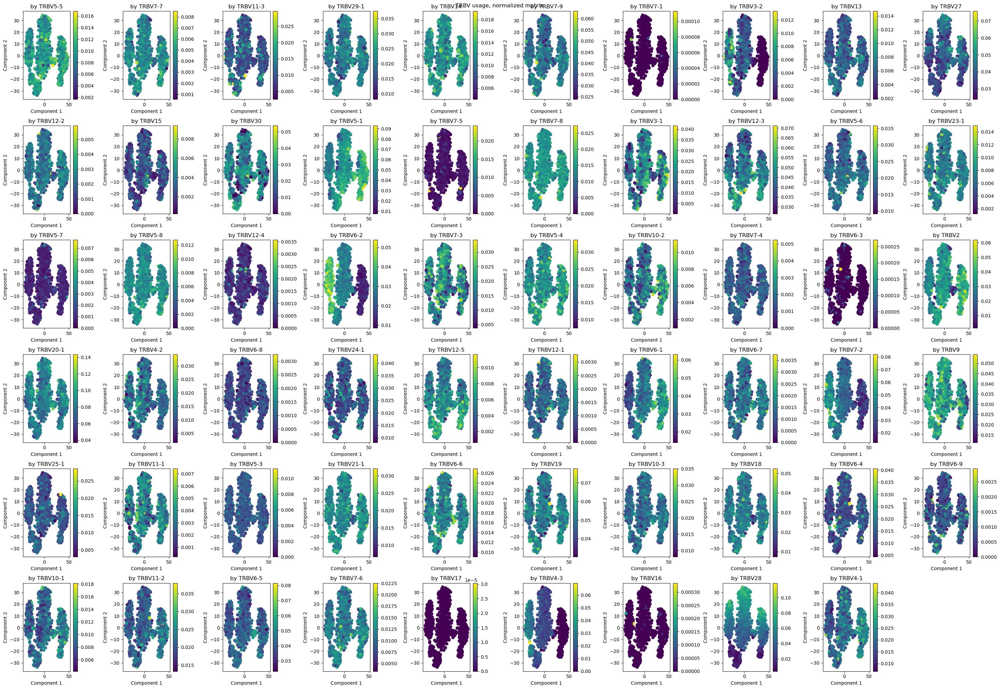

In [15]:
fig = plt.figure(figsize=(30, 21))
gs = GridSpec(nrows=6, 
              ncols=10)
font_size=20
delta_x=-0.1
delta_y=1.1
for i, v_gene in enumerate(v_genes_b):
    ax_i = fig.add_subplot(gs[i // 10, i % 10])
    plot_usage_matrix_pca(um_norm_bv, target=v_gene, plot_gradient=True, method=TSNE, ax=ax_i)
    ax_i.set_title(f'by {v_gene}')
fig.suptitle('TRBV usage, normalized matrix')
fig.tight_layout()    
plt.savefig('figures/allele/norm_matrix_TRBV.png')
plt.savefig('figures/allele/norm_matrix_TRBV.svg')

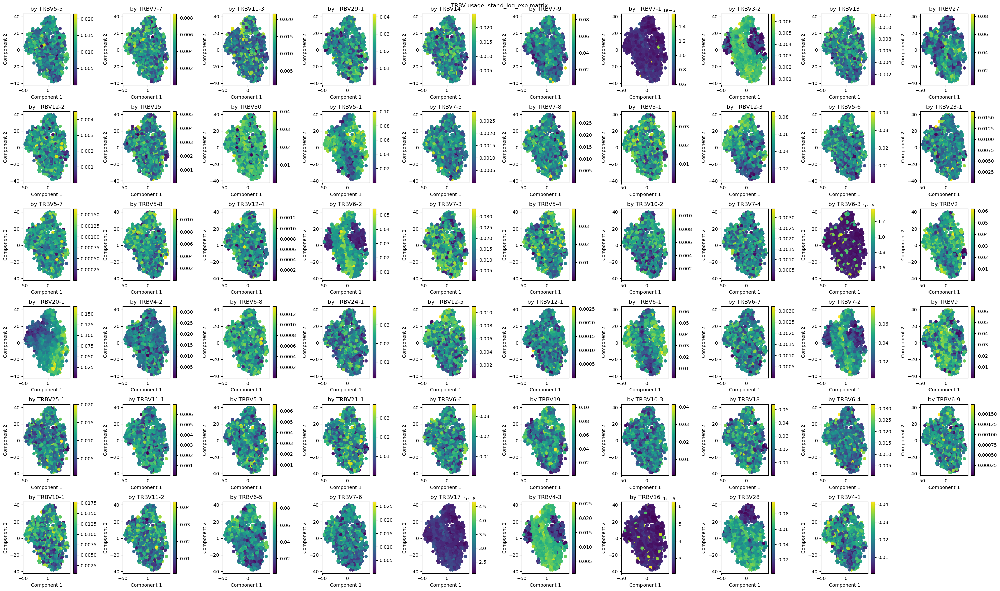

In [16]:
fig = plt.figure(figsize=(30, 18))
gs = GridSpec(nrows=6, 
              ncols=10)
font_size=20
delta_x=-0.1
delta_y=1.1
for i, v_gene in enumerate(v_genes_b):
    ax_i = fig.add_subplot(gs[i // 10, i % 10])
    plot_usage_matrix_pca(um_stand_log_exp_bv, target=v_gene, plot_gradient=True, method=TSNE, ax=ax_i)
    ax_i.set_title(f'by {v_gene}')
fig.suptitle('TRBV usage, stand_log_exp matrix')
fig.tight_layout()    
plt.savefig('figures/allele/stand_log_exp_matrix_TRBV.png')
plt.savefig('figures/allele/stand_log_exp_matrix_TRBV.svg')

IndexError: index 6 is out of bounds for axis 0 with size 6

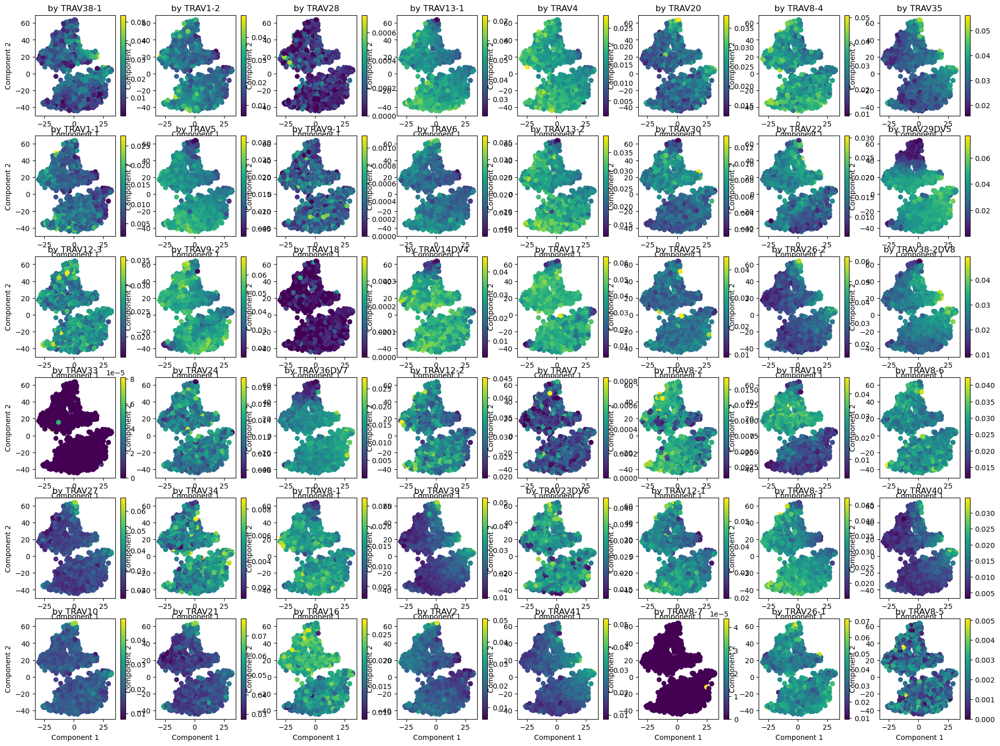

In [17]:
fig = plt.figure(figsize=(24, 18))
gs = GridSpec(nrows=6, 
              ncols=8)
font_size=20
delta_x=-0.1
delta_y=1.1
for i, v_gene in enumerate(v_genes_a):
    ax_i = fig.add_subplot(gs[i // 8, i % 8])
    plot_usage_matrix_pca(um_norm_av, target=v_gene, plot_gradient=True, method=TSNE, ax=ax_i)
    ax_i.set_title(f'by {v_gene}')
fig.suptitle('TRAV usage, normalized matrix')
fig.tight_layout()    
plt.savefig('figures/allele/norm_matrix_TRAV.png')
plt.savefig('figures/allele/norm_matrix_TRAV.svg')

In [ ]:
fig = plt.figure(figsize=(24, 18))
gs = GridSpec(nrows=6, 
              ncols=8)
font_size=20
delta_x=-0.1
delta_y=1.1
for i, v_gene in enumerate(v_genes_a):
    ax_i = fig.add_subplot(gs[i // 8, i % 8])
    plot_usage_matrix_pca(um_stand_log_exp_av, target=v_gene, plot_gradient=True, method=TSNE, ax=ax_i)
    ax_i.set_title(f'by {v_gene}')
fig.suptitle('TRAV usage, stand_log_exp matrix')
fig.tight_layout()    
plt.savefig('figures/allele/stand_log_exp_matrix_TRAV.png')
plt.savefig('figures/allele/stand_log_exp_matrix_TRAV.svg')

In [ ]:
fig = plt.figure(figsize=(15, 9))
gs = GridSpec(nrows=3, 
              ncols=5)
font_size=20
delta_x=-0.1
delta_y=1.1
for i, v_gene in enumerate(j_genes_b):
    ax_i = fig.add_subplot(gs[i // 5, i % 5])
    plot_usage_matrix_pca(um_norm_bj, target=v_gene, plot_gradient=True, method=TSNE, ax=ax_i)
    ax_i.set_title(f'by {v_gene}')
fig.suptitle('TRBJ usage, normalized matrix')
fig.tight_layout()    
plt.savefig('figures/allele/norm_matrix_TRBJ.png')
plt.savefig('figures/allele/norm_matrix_TRBJ.svg')  

In [ ]:
fig = plt.figure(figsize=(15, 9))
gs = GridSpec(nrows=3, 
              ncols=5)
font_size=20
delta_x=-0.1
delta_y=1.1
for i, v_gene in enumerate(j_genes_b):
    ax_i = fig.add_subplot(gs[i // 5, i % 5])
    plot_usage_matrix_pca(um_stand_log_exp_bj, target=v_gene, plot_gradient=True, method=TSNE, ax=ax_i)
    ax_i.set_title(f'by {v_gene}')
fig.suptitle('TRBJ usage, stand_log_exp matrix')
fig.tight_layout()    
plt.savefig('figures/allele/stand_log_exp_matrix_TRBJ.png')
plt.savefig('figures/allele/stand_log_exp_matrix_TRBJ.svg')  

In [ ]:
fig = plt.figure(figsize=(27, 21))
gs = GridSpec(nrows=7, 
              ncols=9)
font_size=20
delta_x=-0.1
delta_y=1.1
for i, v_gene in enumerate(j_genes_a):
    ax_i = fig.add_subplot(gs[i // 9, i % 9])
    plot_usage_matrix_pca(um_norm_aj, target=v_gene, plot_gradient=True, method=TSNE, ax=ax_i)
    ax_i.set_title(f'by {v_gene}')
fig.suptitle('TRAJ usage, normalized matrix')
fig.tight_layout()    
plt.savefig('figures/allele/norm_matrix_TRAJ.png')
plt.savefig('figures/allele/norm_matrix_TRAJ.svg')

In [ ]:
fig = plt.figure(figsize=(27, 21))
gs = GridSpec(nrows=7, 
              ncols=9)
font_size=20
delta_x=-0.1
delta_y=1.1
for i, v_gene in enumerate(j_genes_a):
    ax_i = fig.add_subplot(gs[i // 9, i % 9])
    plot_usage_matrix_pca(um_stand_log_exp_aj, target=v_gene, plot_gradient=True, method=TSNE, ax=ax_i)
    ax_i.set_title(f'by {v_gene}')
fig.suptitle('TRAJ usage, stand_log_exp matrix')
fig.tight_layout()    
plt.savefig('figures/allele/stand_log_exp_matrix_TRAJ.png')
plt.savefig('figures/allele/stand_log_exp_matrix_TRAJ.svg')

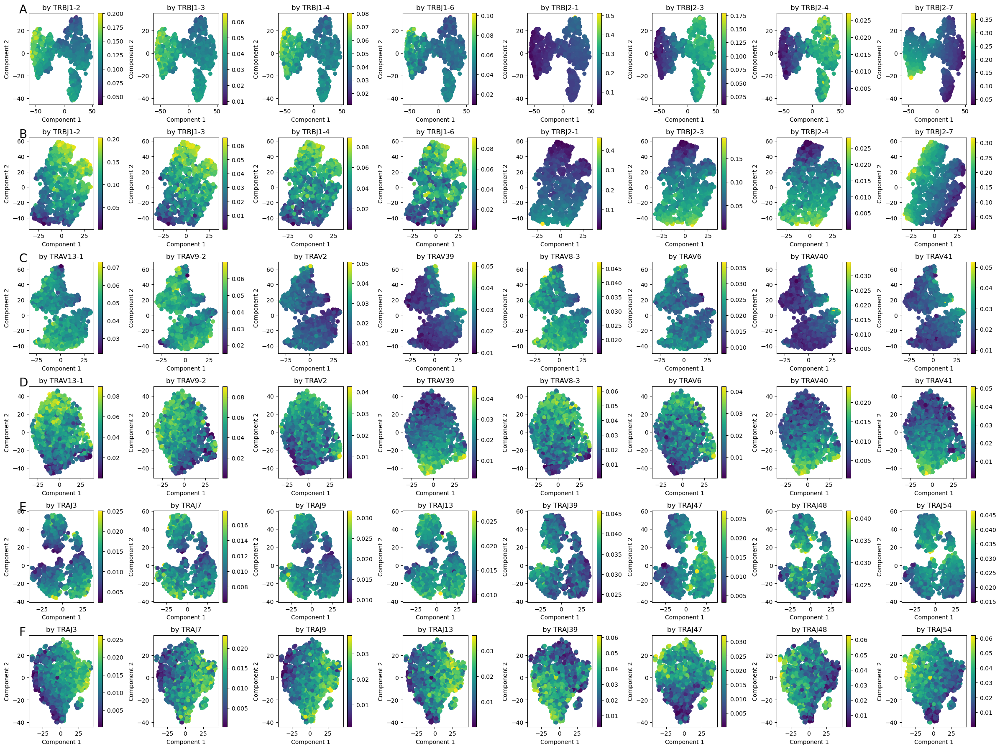

In [27]:
fig = plt.figure(figsize=(24, 18))
gs = GridSpec(nrows=6, 
              ncols=8)
font_size=20
delta_x=-0.15
delta_y=1.1

for i, v_gene in enumerate(['TRBJ1-2', 'TRBJ1-3', 'TRBJ1-4', 'TRBJ1-6', 'TRBJ2-1', 'TRBJ2-3', 'TRBJ2-4', 'TRBJ2-7']):
    ax_i = fig.add_subplot(gs[0, i % 8])
    plot_usage_matrix_pca(um_norm_bj, target=v_gene, plot_gradient=True, method=TSNE, ax=ax_i)
    ax_i.set_title(f'by {v_gene}')
    if i == 0:
        ax_i.text(delta_x, delta_y, 'A',
             horizontalalignment='left',
             verticalalignment='top',
             transform=ax_i.transAxes,
             size=font_size)   

for i, v_gene in enumerate(['TRBJ1-2', 'TRBJ1-3', 'TRBJ1-4', 'TRBJ1-6', 'TRBJ2-1', 'TRBJ2-3', 'TRBJ2-4', 'TRBJ2-7']):
    ax_i = fig.add_subplot(gs[1, i % 8])
    plot_usage_matrix_pca(um_stand_log_exp_bj, target=v_gene, plot_gradient=True, method=TSNE, ax=ax_i)
    ax_i.set_title(f'by {v_gene}')
    if i == 0:
        ax_i.text(delta_x, delta_y, 'B',
             horizontalalignment='left',
             verticalalignment='top',
             transform=ax_i.transAxes,
             size=font_size)   

for i, v_gene in enumerate(['TRAV13-1', 'TRAV9-2', 'TRAV2', 'TRAV39', 'TRAV8-3', 'TRAV6', 'TRAV40', 'TRAV41']):
    ax_i = fig.add_subplot(gs[2, i % 8])
    plot_usage_matrix_pca(um_norm_av, target=v_gene, plot_gradient=True, method=TSNE, ax=ax_i)
    ax_i.set_title(f'by {v_gene}') 
    if i == 0:
        ax_i.text(delta_x, delta_y, 'C',
             horizontalalignment='left',
             verticalalignment='top',
             transform=ax_i.transAxes,
             size=font_size)   

for i, v_gene in enumerate(['TRAV13-1', 'TRAV9-2', 'TRAV2', 'TRAV39', 'TRAV8-3', 'TRAV6', 'TRAV40', 'TRAV41']):
    ax_i = fig.add_subplot(gs[3, i % 8])
    plot_usage_matrix_pca(um_stand_log_exp_av, target=v_gene, plot_gradient=True, method=TSNE, ax=ax_i)
    ax_i.set_title(f'by {v_gene}') 
    if i == 0:
        ax_i.text(delta_x, delta_y, 'D',
             horizontalalignment='left',
             verticalalignment='top',
             transform=ax_i.transAxes,
             size=font_size)   

for i, v_gene in enumerate(['TRAJ3', 'TRAJ7', 'TRAJ9', 'TRAJ13', 'TRAJ39', 'TRAJ47', 'TRAJ48', 'TRAJ54']):
    ax_i = fig.add_subplot(gs[4, i % 8])
    plot_usage_matrix_pca(um_norm_aj, target=v_gene, plot_gradient=True, method=TSNE, ax=ax_i)
    ax_i.set_title(f'by {v_gene}') 
    if i == 0:
        ax_i.text(delta_x, delta_y, 'E',
             horizontalalignment='left',
             verticalalignment='top',
             transform=ax_i.transAxes,
             size=font_size)   

for i, v_gene in enumerate(['TRAJ3', 'TRAJ7', 'TRAJ9', 'TRAJ13', 'TRAJ39', 'TRAJ47', 'TRAJ48', 'TRAJ54']):
    ax_i = fig.add_subplot(gs[5, i % 8])
    plot_usage_matrix_pca(um_stand_log_exp_aj, target=v_gene, plot_gradient=True, method=TSNE, ax=ax_i)
    ax_i.set_title(f'by {v_gene}') 
    if i == 0:
        ax_i.text(delta_x, delta_y, 'F',
             horizontalalignment='left',
             verticalalignment='top',
             transform=ax_i.transAxes,
             size=font_size)   

    
fig.tight_layout()    
plt.savefig('figures/supp_fig6.png')
plt.savefig('figures/supp_fig6.svg')
plt.savefig('figures/supp_fig6.pdf')